# Importing Libraries

In [3]:
# !rm -rf /kaggle/working/*

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
from tensorflow.keras.preprocessing.image import img_to_array, load_img
# Confusion Matrix
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D,Dropout,BatchNormalization
from tensorflow.keras.models import Model , load_model
from tensorflow.keras.initializers import random_uniform, glorot_uniform, constant, identity
from tensorflow.keras.preprocessing import image


2024-08-19 09:57:14.897226: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-19 09:57:14.897358: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-19 09:57:15.038992: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Data Preprocessing

In [7]:
img_shape=(224,224)
BATCH_SIZE= 32

In [8]:
# Data generators including data augmentation and normalization
# Define the data generator for augmentation with simplified settings
train_test_val_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.4,1.5],
    fill_mode='nearest'
)

val_test_datagen = ImageDataGenerator(rescale=1./255)
# Load training data with augmentations
train_data_gen = train_test_val_datagen.flow_from_directory(
    '/kaggle/input/teeth-dataset1/Teeth_Dataset/Training',
    target_size=img_shape,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Load validation data without augmentations
val_data_gen = val_test_datagen.flow_from_directory(
    '/kaggle/input/teeth-dataset1/Teeth_Dataset/Validation',
    target_size=img_shape,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Load test data without augmentations
test_data_gen = val_test_datagen.flow_from_directory(
    '/kaggle/input/teeth-dataset1/Teeth_Dataset/Testing',
    target_size=img_shape,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Verify class labels
print("Class indices:", train_data_gen.class_indices)


Found 3087 images belonging to 7 classes.
Found 1028 images belonging to 7 classes.
Found 1028 images belonging to 7 classes.
Class indices: {'CaS': 0, 'CoS': 1, 'Gum': 2, 'MC': 3, 'OC': 4, 'OLP': 5, 'OT': 6}


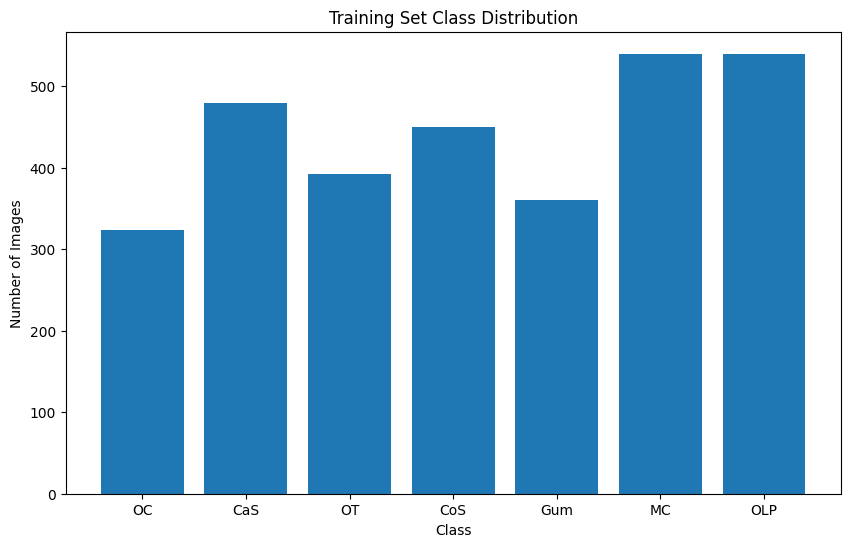

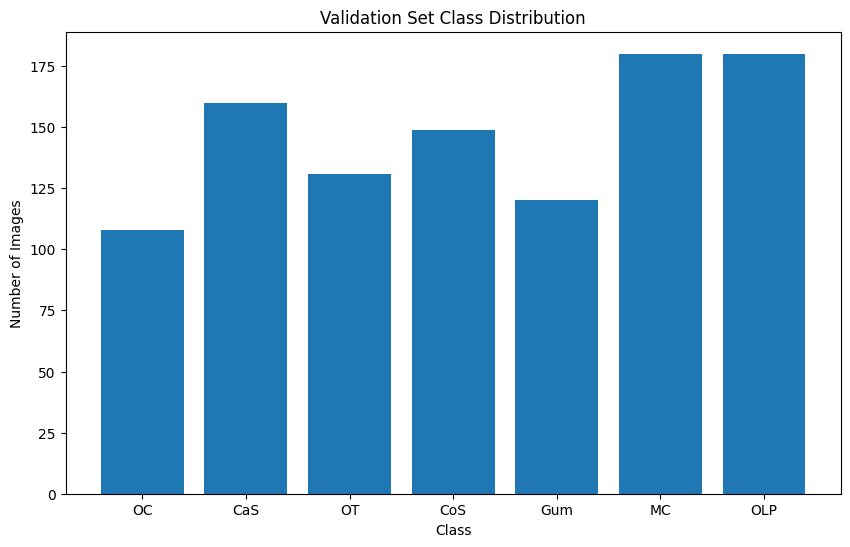

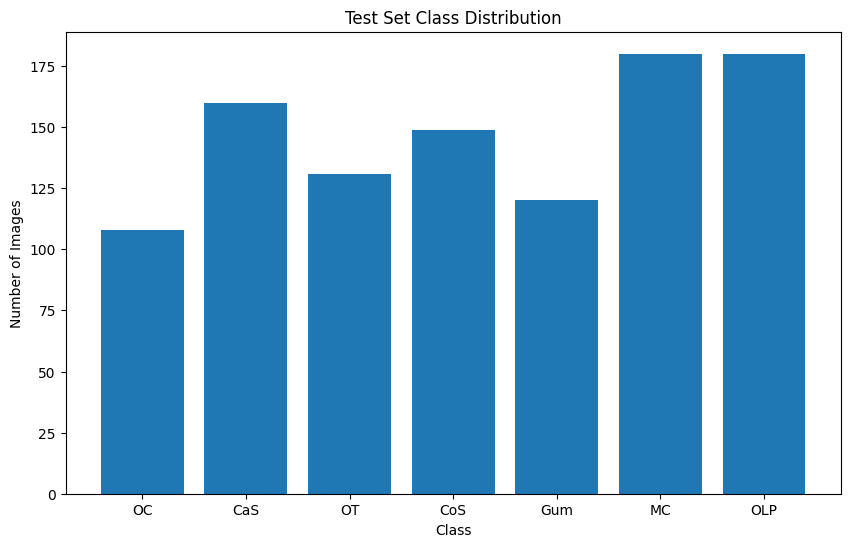

In [7]:
#### Visualizing every class distribution ##########
def count_images(directory):
    class_counts = Counter()
    for class_dir in os.listdir(directory):
        class_path = os.path.join(directory, class_dir)
        if os.path.isdir(class_path):
            class_counts[class_dir] = len(os.listdir(class_path))
    return class_counts

# Count images in each set
train_class_counts = count_images('/kaggle/input/teeth-dataset1/Teeth_Dataset/Training')
val_class_counts = count_images('/kaggle/input/teeth-dataset1/Teeth_Dataset/Validation')
test_class_counts = count_images('/kaggle/input/teeth-dataset1/Teeth_Dataset/Testing')

# Plot class distribution
def plot_class_distribution(counts, title):
    plt.figure(figsize=(10, 6))
    plt.bar(counts.keys(), counts.values())
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.title(title)
    plt.show()

plot_class_distribution(train_class_counts, 'Training Set Class Distribution')
plot_class_distribution(val_class_counts, 'Validation Set Class Distribution')
plot_class_distribution(test_class_counts, 'Test Set Class Distribution')

### The data seems to be unbalanced

Original Image array range: 0.0 255.0
Original Image array dtype: float32


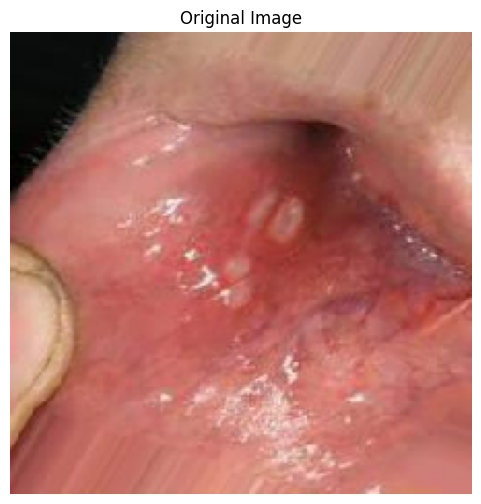

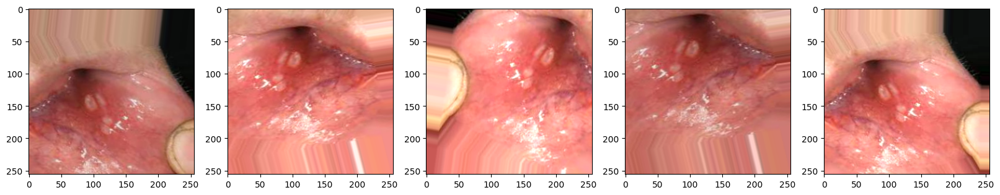

In [8]:
### Visualizing an original and augmented image

# Load a sample image from the training set
sample_image_path = '/kaggle/input/teeth-dataset1/Teeth_Dataset/Testing/CaS/a_101_0_1635.jpg' 
sample_image = load_img(sample_image_path, target_size=img_shape)
sample_image_array = img_to_array(sample_image)
sample_image_array = np.expand_dims(sample_image_array, axis=0)

# Check the range and type of the original image array
print("Original Image array range:", sample_image_array.min(), sample_image_array.max())
print("Original Image array dtype:", sample_image_array.dtype)

# Display the original image
plt.figure(figsize=(6, 6))
plt.imshow(sample_image_array[0] / 255.0)  # Rescale to [0, 1] range for displaying
plt.title('Original Image')
plt.axis('off')
plt.show()

def visualize_augmentation(datagen, image_path):
    img = tf.keras.preprocessing.image.load_img(image_path)
    x = tf.keras.preprocessing.image.img_to_array(img)
    x = x.reshape((1,) + x.shape)

    i = 0
    fig, ax = plt.subplots(1, 5, figsize=(20, 20))
    for batch in datagen.flow(x, batch_size=1):
        ax[i].imshow(tf.keras.preprocessing.image.array_to_img(batch[0]))
        i += 1
        if i % 5 == 0:
            break
    plt.show()

# Set image path
image_path = "/kaggle/input/teeth-dataset1/Teeth_Dataset/Training/CaS/a_100_0_4424.jpg"

# Visualize augmented images
visualize_augmentation(train_test_val_datagen, sample_image_path)

In [9]:
# Assigning weights to the data to reduce the effect of the imbalancing in the data

class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(train_data_gen.classes), y=train_data_gen.classes)
class_weights_dict = dict(enumerate(class_weights))
print("Class Weights: ", class_weights_dict)

Class Weights:  {0: 0.91875, 1: 0.98, 2: 1.225, 3: 0.8166666666666667, 4: 1.3611111111111112, 5: 0.8166666666666667, 6: 1.1221374045801527}


# Building the model

In [12]:
def identity_block(X, f, filters, initializer=random_uniform):
    """
    Implementation of the identity block 
    
    Arguments:
    X -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    f -- integer, specifying the shape of the middle CONV's window for the main path
    filters -- python list of integers, defining the number of filters in the CONV layers of the main path
    initializer -- to set up the initial weights of a layer. Equals to random uniform initializer
    
    Returns:
    X -- output of the identity block, tensor of shape (m, n_H, n_W, n_C)
    """
    
    
    F1, F2, F3 = filters
    
    # Save the input value. 
    X_shortcut = X
    
    
    X = Conv2D(filters = F1, kernel_size = 1, strides = (1,1), padding = 'valid', kernel_initializer = initializer(seed=0))(X)
    X = BatchNormalization(axis = 3)(X) # Default axis
    X = Activation('relu')(X)
    
   
    
    
    X = Conv2D(filters = F2, kernel_size = (f,f), strides = (1,1), padding = 'same', kernel_initializer = initializer(seed=0))(X)
    X = X = BatchNormalization(axis = 3)(X)
    X = Activation('relu')(X)

    
    
    X =Conv2D(filters = F3, kernel_size = 1, strides = (1,1), padding = 'valid', kernel_initializer = initializer(seed=0))(X)
    X =BatchNormalization(axis = 3)(X)
    
    X = Add()([X,X_shortcut])
    X =Activation('relu')(X)
   
    return X

In [13]:
def convolutional_block(X, f, filters, s = 2, initializer=glorot_uniform):
    """
    Implementation of the convolutional block 
    
    Arguments:
    X -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    f -- integer, specifying the shape of the middle CONV's window for the main path
    filters -- python list of integers, defining the number of filters in the CONV layers of the main path
    s -- Integer, specifying the stride to be used
    initializer -- to set up the initial weights of a layer. Equals to Glorot uniform initializer, 
                   also called Xavier uniform initializer.
    
    Returns:
    X -- output of the convolutional block, tensor of shape (m, n_H, n_W, n_C)
    """
    
    
    F1, F2, F3 = filters
    
    X_shortcut = X


    
    
    X = Conv2D(filters = F1, kernel_size = 1, strides = (s, s), padding='valid', kernel_initializer = initializer(seed=0))(X)
    X = BatchNormalization(axis = 3)(X)
    X = Activation('relu')(X)

    
    X = Conv2D(filters = F2, kernel_size = (f,f), strides = (1, 1), padding='same', kernel_initializer = initializer(seed=0))(X)
    X = BatchNormalization(axis = 3)(X)
    X = Activation('relu')(X)

    X = Conv2D(filters = F3, kernel_size = 1, strides = (1, 1), padding='valid', kernel_initializer = initializer(seed=0))(X)
    X = BatchNormalization(axis = 3)(X)
    
    X_shortcut = Conv2D(filters = F3, kernel_size = 1, strides = (s, s), padding='valid', kernel_initializer = initializer(seed=0))(X_shortcut) 
    X_shortcut = BatchNormalization(axis = 3)(X_shortcut)
    
   

    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)
    
    return X


In [14]:
def ResNet50(input_shape = (224, 224, 3), classes = 7, training=False):
    """

    Arguments:
    input_shape -- shape of the images of the dataset
    classes -- integer, number of classes

    Returns:
    model -- a Model() instance in Keras
    """
    
    # Define the input as a tensor with shape input_shape
    X_input = Input(input_shape)

    
    X = ZeroPadding2D((3, 3))(X_input)
    
    X = Conv2D(64, (7, 7), strides = (2, 2), kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3)(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    X = convolutional_block(X, f = 3, filters = [64, 64, 256], s = 1)
    X = identity_block(X, 3, [64, 64, 256])
    X = identity_block(X, 3, [64, 64, 256])
    
    X = convolutional_block(X, f=3, filters = [128,128,512], s=2 )
    
    X = identity_block(X, 3, [128,128,512])
    X = identity_block(X, 3, [128,128,512])
    X = identity_block(X, 3, [128,128,512])

    X = convolutional_block(X, f=3, filters = [256, 256, 1024], s=2 )

    
    X = identity_block(X, 3, [256, 256, 1024])
    X = identity_block(X, 3, [256, 256, 1024])
    X = identity_block(X, 3, [256, 256, 1024])
    X = identity_block(X, 3, [256, 256, 1024])
    X = identity_block(X, 3, [256, 256, 1024])

    
    X = convolutional_block(X, f=3, filters = [512, 512, 2048], s=2 )
    X = identity_block(X, 3, [512, 512, 2048])
    X = identity_block(X, 3, [512, 512, 2048])

# fine tuning the model

    X = Flatten()(X)
    
    
    X = Dense(512, activation='relu',kernel_regularizer = tf.keras.regularizers.l2(0.001))(X)
    
    # output layer
    
    X = Dense(classes, activation='softmax')(X)
    
    
    # Create model
    model = Model(inputs = X_input, outputs = X)

    return model

In [15]:
model = ResNet50(input_shape = (224, 224, 3), classes = 7)
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 112, 112,  │      9,472 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 112, 112,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 55, 55,    │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 55, 55,    │      4,160 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 55, 55,    │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 55, 55,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 55, 55,    │     36,928 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 55, 55,    │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 55, 55,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 55, 55,    │     16,640 │ activation_2[0][… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 55, 55,    │     16,640 │ max_pooling2d[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 55, 55,    │      1,024 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 55, 55,    │      1,024 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 55, 55,    │          0 │ batch_normalizat

 Total params: 74,972,039 (286.00 MB)

 Trainable params: 74,918,919 (285.79 MB)

 Non-trainable params: 53,120 (207.50 KB)

None


In [16]:
### Compiling the model ###

opt = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Model Training

In [17]:
from keras.callbacks import ModelCheckpoint
# Create a callback that saves the model's weights
checkpoint = ModelCheckpoint(
    filepath='model_checkpoint.keras',  # File path where the model will be saved
    monitor='val_loss',  # Metric to monitor
    verbose=1,  # Verbosity mode, 1 will print messages when saving the model
    save_best_only=True,  # Save only the best model according to the monitored metric
    mode='min'  # Mode for the monitored metric, 'min' to save when it decreases
)

In [18]:
#implement Early stopping
from keras.callbacks import  EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True
)

In [19]:
# trying different learning rates 
from keras.callbacks import  ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=5,
    min_lr=0.00000001
)

In [20]:
history = model.fit(
    train_data_gen,
    epochs=250,
    validation_data=val_data_gen,
    class_weight=class_weights_dict,
    callbacks = [checkpoint, early_stopping, reduce_lr]
)

Epoch 1/250


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1724036571.765050     140 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1724036571.857954     140 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


 6/97 ━━━━━━━━━━━━━━━━━━━━ 11:35 8s/step - accuracy: 0.1423 - loss: 26.6223 

W0000 00:00:1724036610.247914     139 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 932ms/step - accuracy: 0.1597 - loss: 10.8925

W0000 00:00:1724036666.846809     138 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update



Epoch 1: val_loss improved from inf to 2.91092, saving model to model_checkpoint.keras


W0000 00:00:1724036678.795348     139 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


97/97 ━━━━━━━━━━━━━━━━━━━━ 194s 1s/step - accuracy: 0.1599 - loss: 10.8390 - val_accuracy: 0.1449 - val_loss: 2.9109 - learning_rate: 1.0000e-04
Epoch 2/250
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step - accuracy: 0.1991 - loss: 2.8968
Epoch 2: val_loss improved from 2.91092 to 2.86317, saving model to model_checkpoint.keras
97/97 ━━━━━━━━━━━━━━━━━━━━ 53s 509ms/step - accuracy: 0.1991 - loss: 2.8966 - val_accuracy: 0.1449 - val_loss: 2.8632 - learning_rate: 1.0000e-04
Epoch 3/250
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step - accuracy: 0.2253 - loss: 2.8073
Epoch 3: val_loss improved from 2.86317 to 2.81060, saving model to model_checkpoint.keras
97/97 ━━━━━━━━━━━━━━━━━━━━ 52s 511ms/step - accuracy: 0.2252 - loss: 2.8071 - val_accuracy: 0.2023 - val_loss: 2.8106 - learning_rate: 1.0000e-04
Epoch 4/250
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step - accuracy: 0.2381 - loss: 2.7264
Epoch 4: val_loss improved from 2.81060 to 2.75286, saving model to model_checkpoint.keras
97/97 ━━━━━━━━━━━━━━━━━━━━ 54

33/33 ━━━━━━━━━━━━━━━━━━━━ 9s 273ms/step - accuracy: 0.9893 - loss: 0.0370
Test Accuracy: 0.9902724027633667
 3/33 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step

W0000 00:00:1724046436.414435     139 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


33/33 ━━━━━━━━━━━━━━━━━━━━ 10s 190ms/step


W0000 00:00:1724046442.495230     140 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


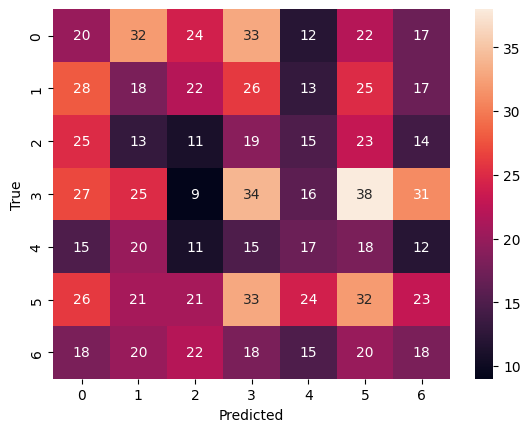

In [21]:
# Evaluate the Model

test_loss, test_acc = model.evaluate(test_data_gen)
print(f"Test Accuracy: {test_acc}")



# Predict the values from the test dataset
Y_pred = model.predict(test_data_gen)
# Convert predictions classes to one hot vectors 
Y_pred_classes = np.argmax(Y_pred, axis=1) 
# Convert test data to one hot vectors
Y_true = test_data_gen.classes
# Compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes) 
# Plot the confusion matrix
sns.heatmap(confusion_mtx, annot=True, fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

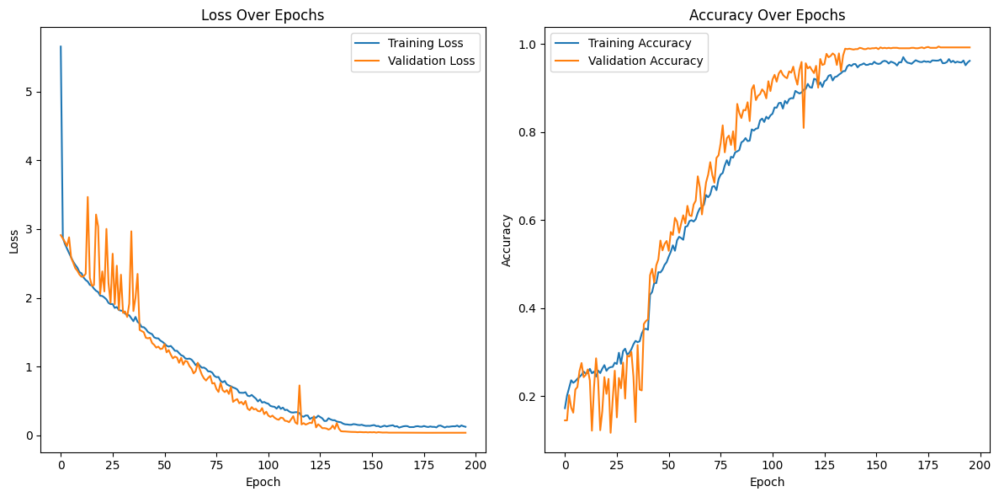

In [22]:
# Extract training and validation metrics
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plot Loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

In [23]:
model.save('model.h5')

In [3]:
model=tf.keras.models.load_model('/kaggle/working/model_checkpoint.keras')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


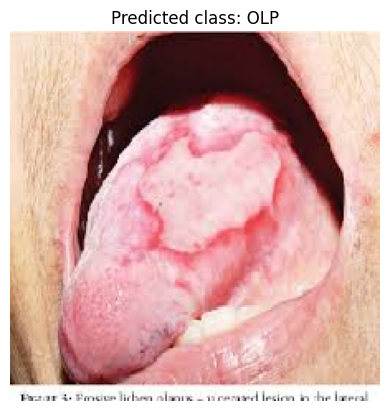

In [6]:

img_path = '/kaggle/input/olp-test/images (2).jpeg'

# Load the image and preprocess it
img = image.load_img(img_path, target_size=(224, 224))  
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  
img_array /= 255.0  # Normalize the image

# Make a prediction
predictions = model.predict(img_array)
predicted_class = np.argmax(predictions, axis=1)

# Define your class names
class_names = ["CaS", "CoS", "Gum", "MC", "OC", "OLP", "OT"]

# Display the image and the predicted class
plt.imshow(img)
plt.title(f"Predicted class: {class_names[predicted_class[0]]}")
plt.axis('off')
plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


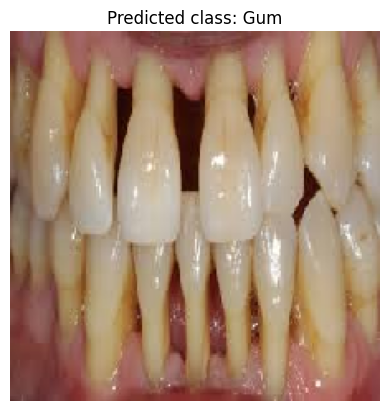

In [7]:
img_path = '/kaggle/input/test22/images (1).jpeg'

# Load the image and preprocess it
img = image.load_img(img_path, target_size=(224, 224))  
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  
img_array /= 255.0  # Normalize the image

# Make a prediction
predictions = model.predict(img_array)
predicted_class = np.argmax(predictions, axis=1)

# Define your class names
class_names = ["CaS", "CoS", "Gum", "MC", "OC", "OLP", "OT"]

# Display the image and the predicted class
plt.imshow(img)
plt.title(f"Predicted class: {class_names[predicted_class[0]]}")
plt.axis('off')
plt.show()


In [ ]:
img_path = '/kaggle/input/test22/images (1).jpeg'

# Load the image and preprocess it
img = image.load_img(img_path, target_size=(224, 224))  
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  
img_array /= 255.0  # Normalize the image

# Make a prediction
predictions = model.predict(img_array)
predicted_class = np.argmax(predictions, axis=1)

# Define your class names
class_names = ["CaS", "CoS", "Gum", "MC", "OC", "OLP", "OT"]

# Display the image and the predicted class
plt.imshow(img)
plt.title(f"Predicted class: {class_names[predicted_class[0]]}")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


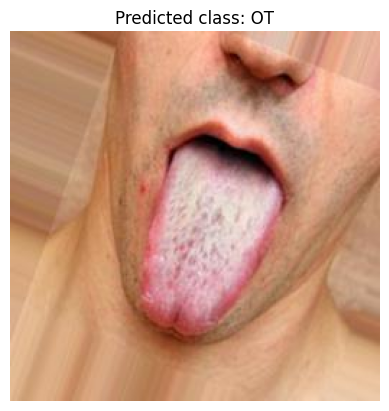

Image: /kaggle/input/testing/testing/20.jpg
Prediction probabilities: [[9.3847065e-04 3.0289100e-06 6.3702977e-08 1.6863168e-04 3.0252912e-07
  1.8395367e-03 9.9704993e-01]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


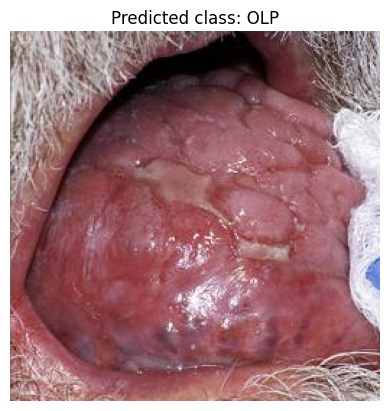

Image: /kaggle/input/testing/testing/6.jpg
Prediction probabilities: [[6.2088952e-11 5.0699618e-14 2.7078037e-14 2.1993950e-05 7.8710991e-06
  9.6952516e-01 3.0445047e-02]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


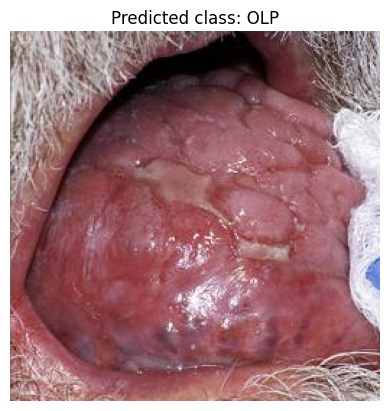

Image: /kaggle/input/testing/testing/5.jpg
Prediction probabilities: [[6.2088952e-11 5.0699618e-14 2.7078037e-14 2.1993950e-05 7.8710991e-06
  9.6952516e-01 3.0445047e-02]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


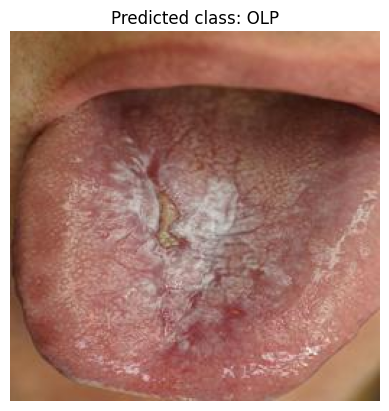

Image: /kaggle/input/testing/testing/8.jpg
Prediction probabilities: [[8.6155962e-09 4.0480586e-07 5.5309660e-11 8.2138814e-07 2.5899263e-04
  9.9962521e-01 1.1454519e-04]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


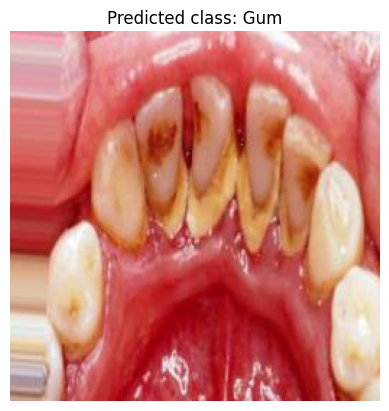

Image: /kaggle/input/testing/testing/30.jpg
Prediction probabilities: [[5.0775151e-07 9.2961037e-37 9.9988937e-01 1.1005193e-04 7.1655975e-08
  5.3030524e-13 3.0459550e-09]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


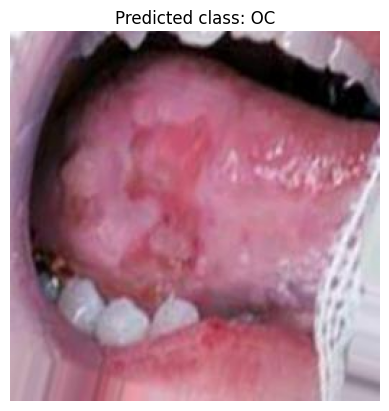

Image: /kaggle/input/testing/testing/33.jpg
Prediction probabilities: [[1.6052168e-16 5.3901198e-36 2.6334310e-10 5.6790236e-06 9.9774462e-01
  2.2496490e-03 7.7690548e-11]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


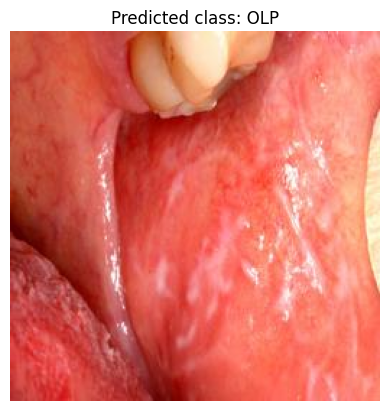

Image: /kaggle/input/testing/testing/10.jpg
Prediction probabilities: [[5.85250142e-08 4.25050661e-10 1.36728975e-08 4.88955448e-05
  3.85587593e-03 9.95642543e-01 4.52600158e-04]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


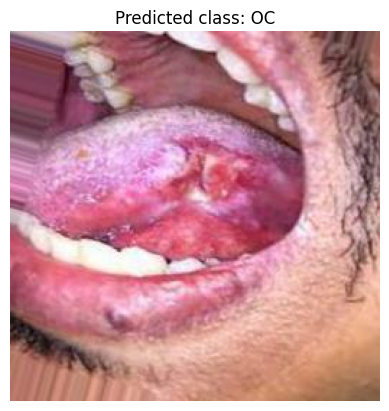

Image: /kaggle/input/testing/testing/35.jpg
Prediction probabilities: [[1.7377955e-14 4.8208276e-33 1.8422455e-08 9.0027734e-04 9.9753749e-01
  1.5622283e-03 1.6148727e-08]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


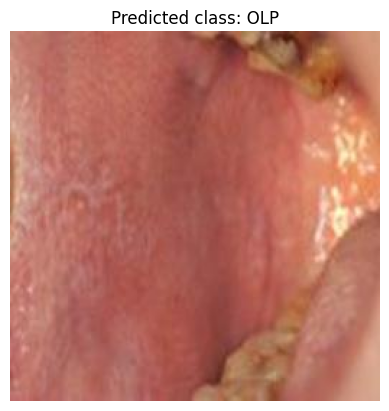

Image: /kaggle/input/testing/testing/9.jpg
Prediction probabilities: [[2.3498185e-12 3.1580488e-08 4.3976185e-14 5.7461325e-10 4.4670618e-05
  9.9995494e-01 3.1028185e-07]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


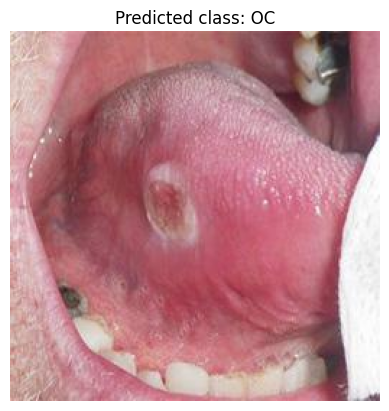

Image: /kaggle/input/testing/testing/37.jpg
Prediction probabilities: [[1.2366056e-04 4.3144912e-13 3.8244270e-03 7.5156905e-02 7.2850722e-01
  1.9033423e-01 2.0536499e-03]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


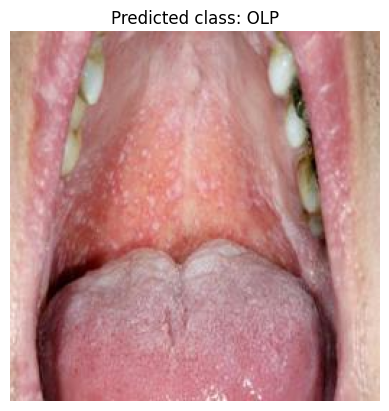

Image: /kaggle/input/testing/testing/1.jpg
Prediction probabilities: [[2.96421832e-10 2.48594446e-14 1.47785638e-11 1.42841565e-03
  8.86610069e-04 9.85556066e-01 1.21289585e-02]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


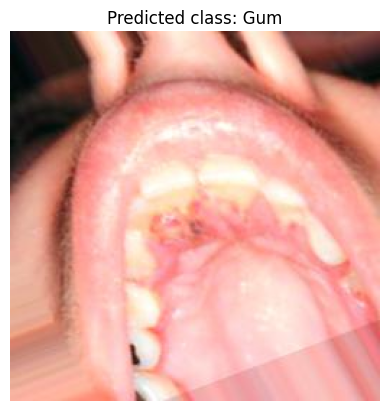

Image: /kaggle/input/testing/testing/29.jpg
Prediction probabilities: [[2.4101976e-03 1.4879471e-21 9.9721587e-01 3.1572054e-04 5.7787114e-05
  1.6208257e-07 2.7710990e-07]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


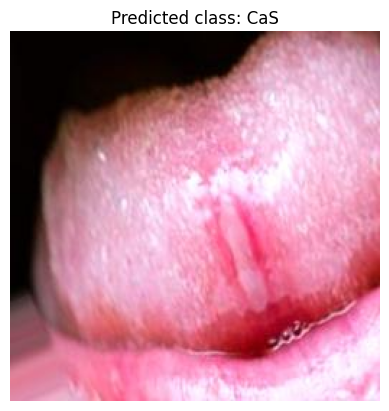

Image: /kaggle/input/testing/testing/16.jpg
Prediction probabilities: [[9.93695080e-01 1.38761550e-06 4.17552702e-03 1.18262404e-04
  1.90405262e-06 7.67182137e-05 1.93109200e-03]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


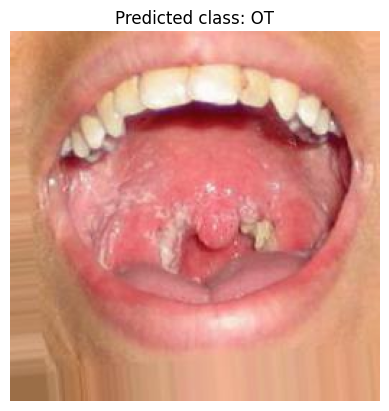

Image: /kaggle/input/testing/testing/23.jpg
Prediction probabilities: [[2.4458019e-03 1.0089700e-09 3.1820329e-07 2.3110278e-03 6.1220044e-07
  2.1527510e-03 9.9308950e-01]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


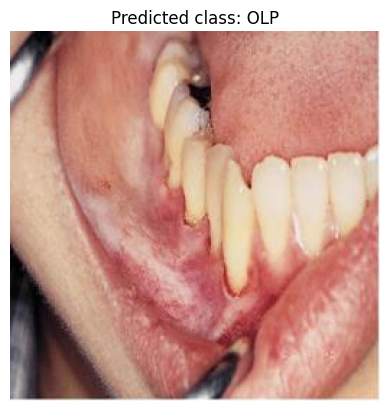

Image: /kaggle/input/testing/testing/7.jpg
Prediction probabilities: [[1.5267936e-11 6.0825531e-13 2.3433352e-12 1.5825552e-05 1.1837175e-03
  9.9847692e-01 3.2353023e-04]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


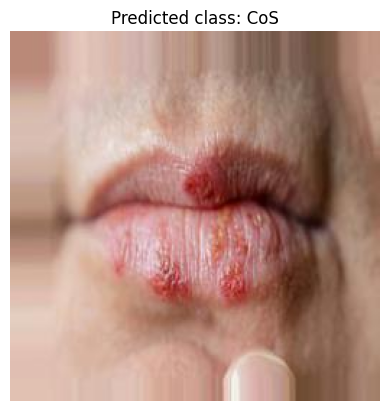

Image: /kaggle/input/testing/testing/28.jpg
Prediction probabilities: [[1.5101004e-04 9.9980569e-01 1.6328887e-08 1.0590448e-08 5.2540337e-09
  1.0279519e-05 3.3070417e-05]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


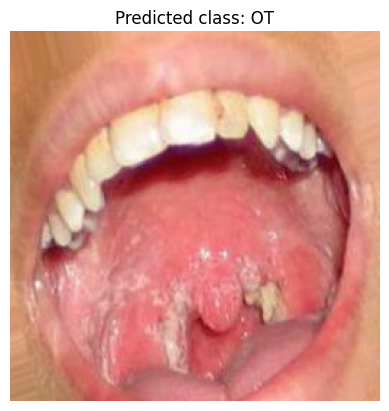

Image: /kaggle/input/testing/testing/22.jpg
Prediction probabilities: [[3.0927215e-04 4.4643636e-11 2.4023673e-06 2.9475378e-02 1.3035760e-04
  4.9357239e-02 9.2072535e-01]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


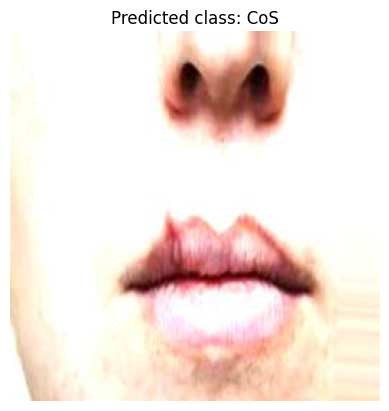

Image: /kaggle/input/testing/testing/24.jpg
Prediction probabilities: [[6.8511283e-05 9.9985254e-01 2.7147964e-09 1.7501884e-09 9.7466180e-10
  7.1995482e-06 7.1696508e-05]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


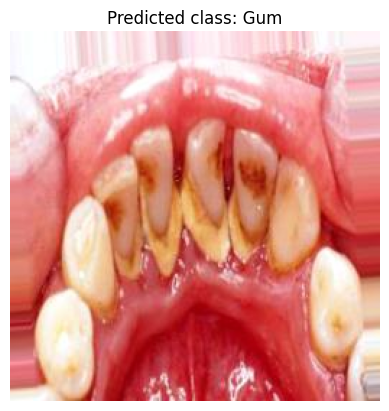

Image: /kaggle/input/testing/testing/31.jpg
Prediction probabilities: [[2.3159935e-06 1.0306571e-33 9.9972254e-01 2.7439784e-04 8.7437996e-07
  4.6420295e-11 2.6060929e-08]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


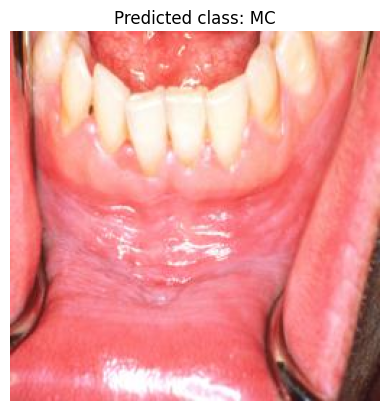

Image: /kaggle/input/testing/testing/13.jpg
Prediction probabilities: [[1.1915610e-10 3.2369995e-41 4.7080914e-05 9.9990964e-01 3.7188132e-05
  3.0791330e-08 6.0205894e-06]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


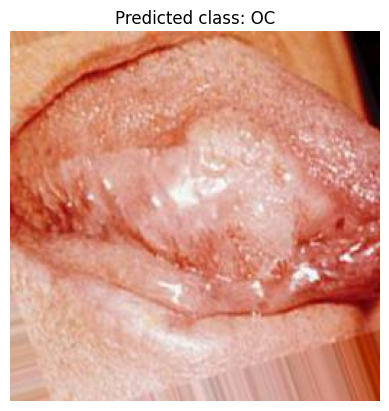

Image: /kaggle/input/testing/testing/32.jpg
Prediction probabilities: [[3.3900059e-07 2.3070967e-18 3.4854459e-04 8.0573484e-03 9.5086056e-01
  4.0703379e-02 2.9831430e-05]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


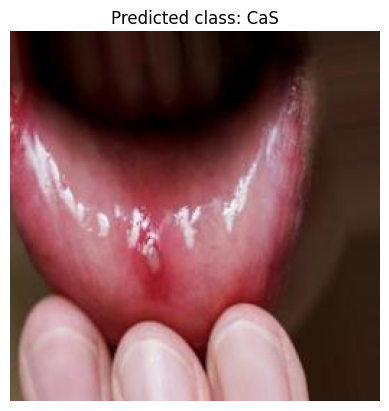

Image: /kaggle/input/testing/testing/17.jpg
Prediction probabilities: [[9.99682963e-01 5.20082267e-07 8.19093621e-05 1.39807199e-07
  1.01605016e-10 3.77509544e-08 2.34548832e-04]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


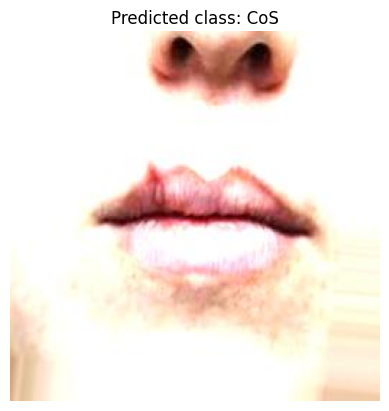

Image: /kaggle/input/testing/testing/26.jpg
Prediction probabilities: [[1.58963285e-05 9.99974132e-01 4.20568497e-10 1.14024186e-10
  1.13134259e-10 1.48340939e-06 8.63479090e-06]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


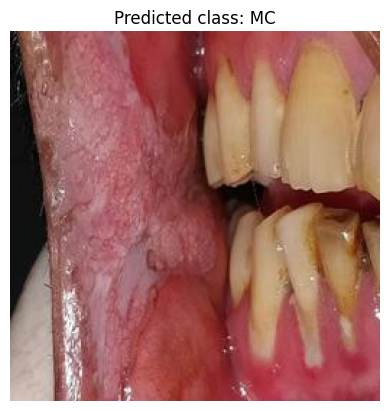

Image: /kaggle/input/testing/testing/15.jpg
Prediction probabilities: [[5.12752729e-09 1.07263996e-35 7.88572128e-04 9.98962760e-01
  2.29874830e-04 1.52018345e-07 1.86596899e-05]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


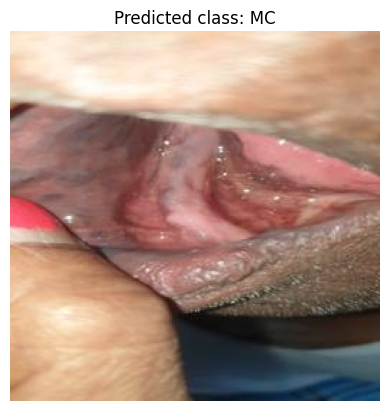

Image: /kaggle/input/testing/testing/12.jpg
Prediction probabilities: [[3.1073488e-09 1.5677343e-30 5.3737360e-05 9.9672544e-01 3.0622336e-03
  2.2003853e-05 1.3663709e-04]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


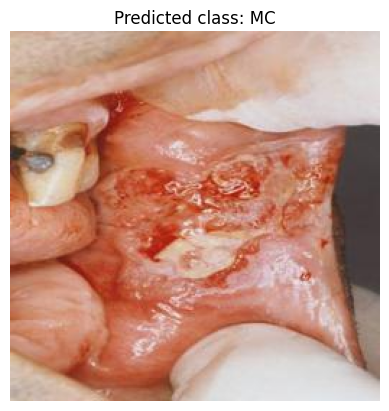

Image: /kaggle/input/testing/testing/11.jpg
Prediction probabilities: [[1.8748771e-09 3.8547348e-34 3.1672101e-04 9.9761498e-01 2.0491534e-03
  1.3532592e-06 1.7857887e-05]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


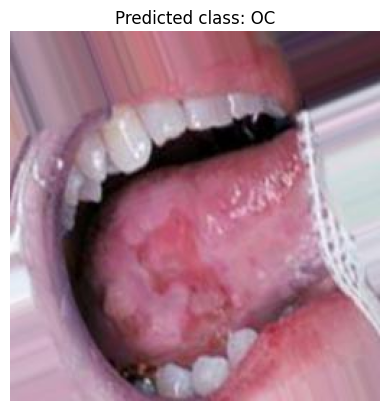

Image: /kaggle/input/testing/testing/34.jpg
Prediction probabilities: [[2.9392190e-13 7.6308895e-30 5.4468650e-08 2.0517778e-04 9.9550945e-01
  4.2852787e-03 1.5491294e-08]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


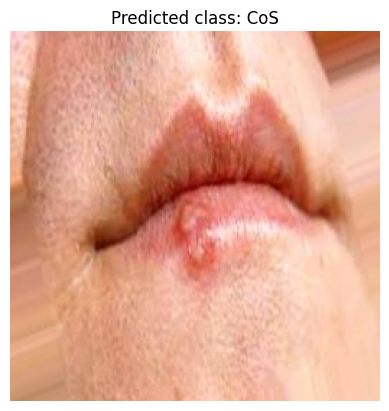

Image: /kaggle/input/testing/testing/27.jpg
Prediction probabilities: [[1.7414839e-04 9.9979651e-01 2.0082432e-08 1.2581871e-08 2.6162006e-09
  2.9481507e-06 2.6395104e-05]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


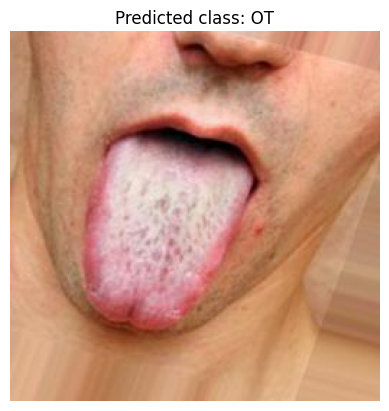

Image: /kaggle/input/testing/testing/21.jpg
Prediction probabilities: [[1.3269053e-03 3.4001630e-08 1.6299667e-08 2.8751676e-05 3.9997881e-09
  7.7416662e-05 9.9856687e-01]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


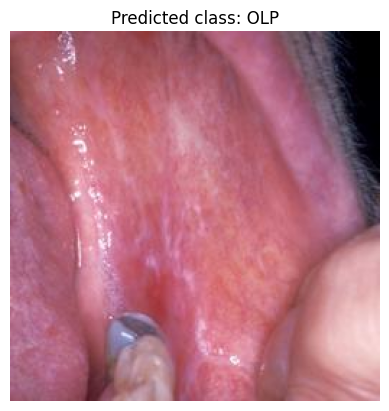

Image: /kaggle/input/testing/testing/4.jpg
Prediction probabilities: [[3.0005872e-08 1.8908473e-09 8.0957691e-10 1.3000998e-05 7.4157928e-04
  9.9863142e-01 6.1387301e-04]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


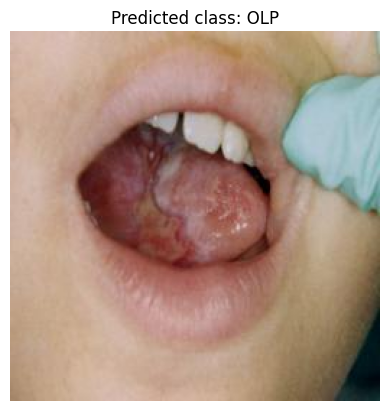

Image: /kaggle/input/testing/testing/3.jpg
Prediction probabilities: [[2.7716192e-08 1.4191187e-12 1.2876775e-07 1.3004389e-03 1.3799059e-01
  8.5989594e-01 8.1290334e-04]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


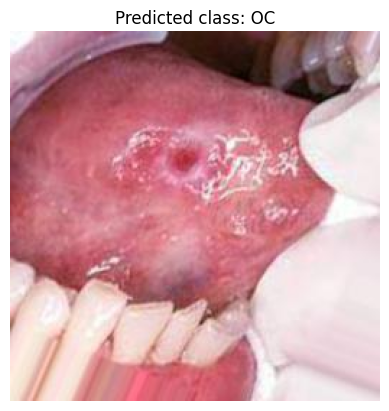

Image: /kaggle/input/testing/testing/36.jpg
Prediction probabilities: [[9.8898106e-16 6.9888956e-37 3.5167285e-09 1.9866135e-04 9.9933046e-01
  4.7077975e-04 7.4882461e-10]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


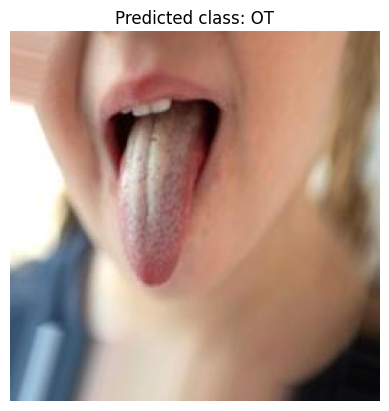

Image: /kaggle/input/testing/testing/19.jpg
Prediction probabilities: [[8.2739033e-03 1.7661396e-04 1.6953210e-06 3.8264960e-04 7.3975657e-06
  1.4056059e-02 9.7710162e-01]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


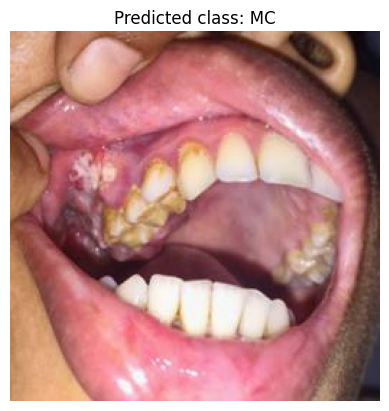

Image: /kaggle/input/testing/testing/14.jpg
Prediction probabilities: [[5.22215426e-09 1.02622365e-29 7.73588727e-06 9.95108783e-01
  3.80992796e-03 4.40009433e-04 6.33618445e-04]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


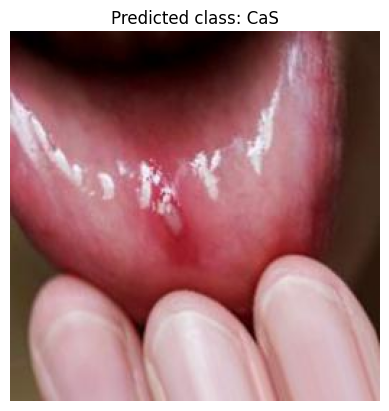

Image: /kaggle/input/testing/testing/18.jpg
Prediction probabilities: [[9.9952525e-01 2.2465334e-09 1.3107999e-04 3.0131434e-07 2.2483276e-11
  4.2249155e-09 3.4322229e-04]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


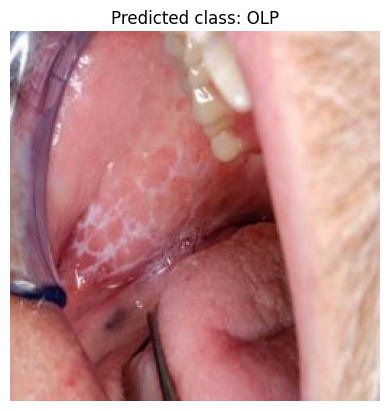

Image: /kaggle/input/testing/testing/2.jpg
Prediction probabilities: [[1.7394514e-10 2.0208436e-08 1.2865025e-12 1.2465436e-07 7.9644429e-05
  9.9988294e-01 3.7364320e-05]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


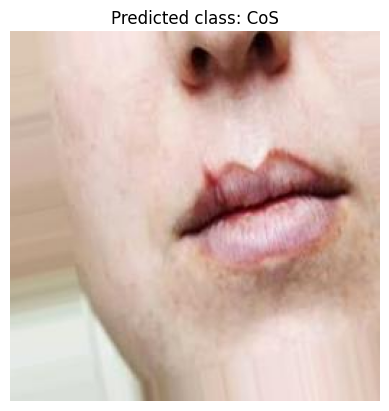

Image: /kaggle/input/testing/testing/25.jpg
Prediction probabilities: [[1.3148386e-05 9.9998331e-01 1.0702878e-10 4.0069704e-11 1.3925589e-11
  2.9573150e-07 3.3364925e-06]]




In [26]:
# trying with diffrent and various number of images 

class_names = ["CaS", "CoS", "Gum", "MC", "OC", "OLP", "OT"]

def load_and_preprocess_image(img_path, target_size=(224, 224)):
    """Load and preprocess a single image."""
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img_array

def predict_images(image_paths, model):
    """Predict the class of multiple images."""
    for img_path in image_paths:
        img_array = load_and_preprocess_image(img_path)
        predictions = model.predict(img_array)
        predicted_class = np.argmax(predictions, axis=1)[0]

        # Display the image and the predicted class
        img = image.load_img(img_path)
        plt.imshow(img)
        plt.title(f"Predicted class: {class_names[predicted_class]}")
        plt.axis('off')
        plt.show()

        # Print the prediction probabilities for each class
        print(f"Image: {img_path}")
        print("Prediction probabilities:", predictions)
        print("\n")

# Paths to the images you want to test
image_folder = '/kaggle/input/testing/testing'
image_paths = [os.path.join(image_folder, fname) for fname in os.listdir(image_folder) if fname.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Predict classes for the images
predict_images(image_paths, model)